# "160" VRSJ AC 2020
Plot


Masahiro Furukawa

Aug 30, 2020

Opti Track Coordination from Hirayama

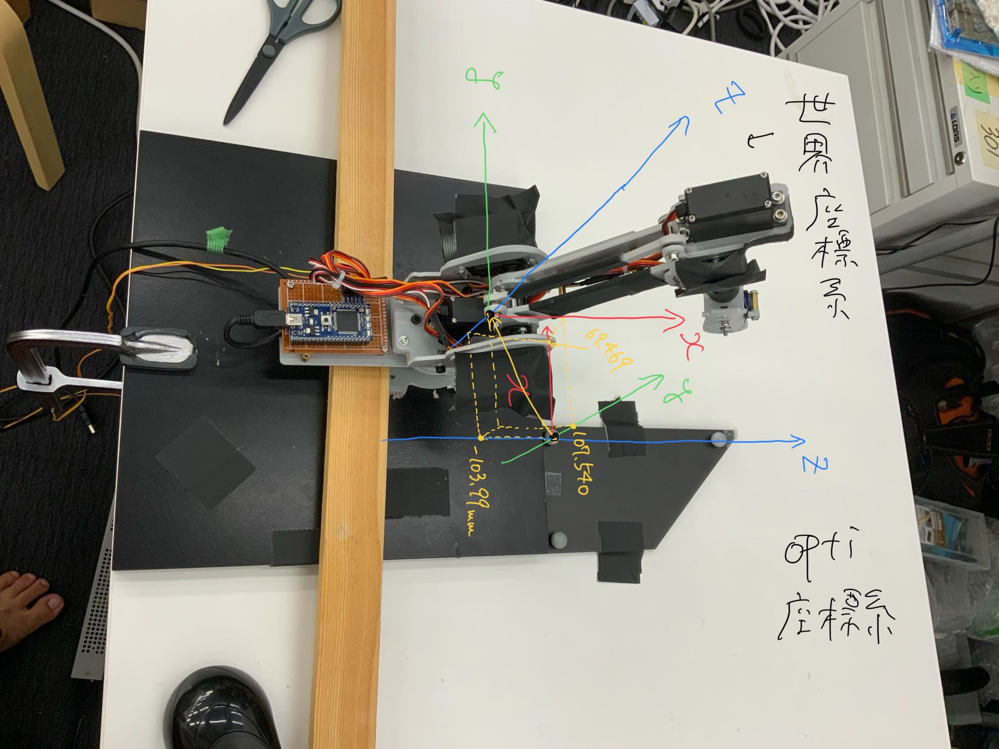

Coordination : Right Hand


Robot : +X(to Front), +Y(to Left), +Z(to Top)
    
Opti : +Z(to Front), +X(to Left), +Y(to Top)

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df =  pd.read_csv("jikken160.csv", header=0, skiprows = 6)
sw =  pd.read_excel("sweep.xlsx",header=0)

df['x(mm)'] = df['x(mm)']*1000.0
df['y(mm)'] = df['y(mm)']*1000.0
df['z(mm)'] = df['z(mm)']*1000.0

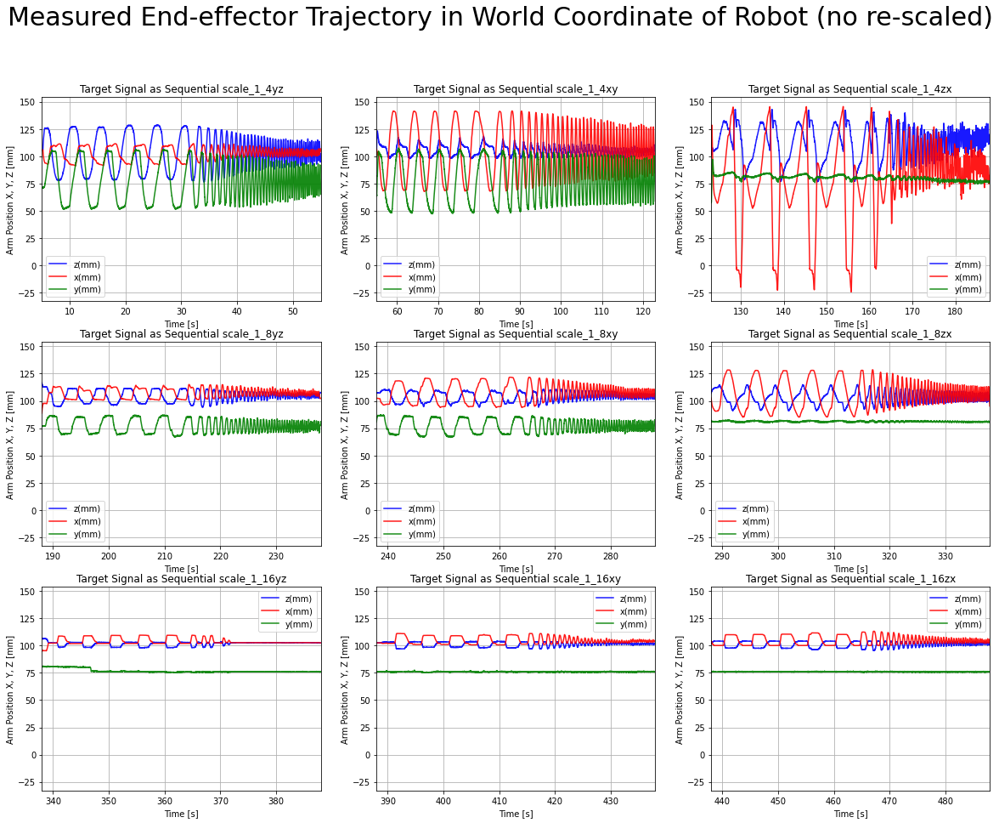

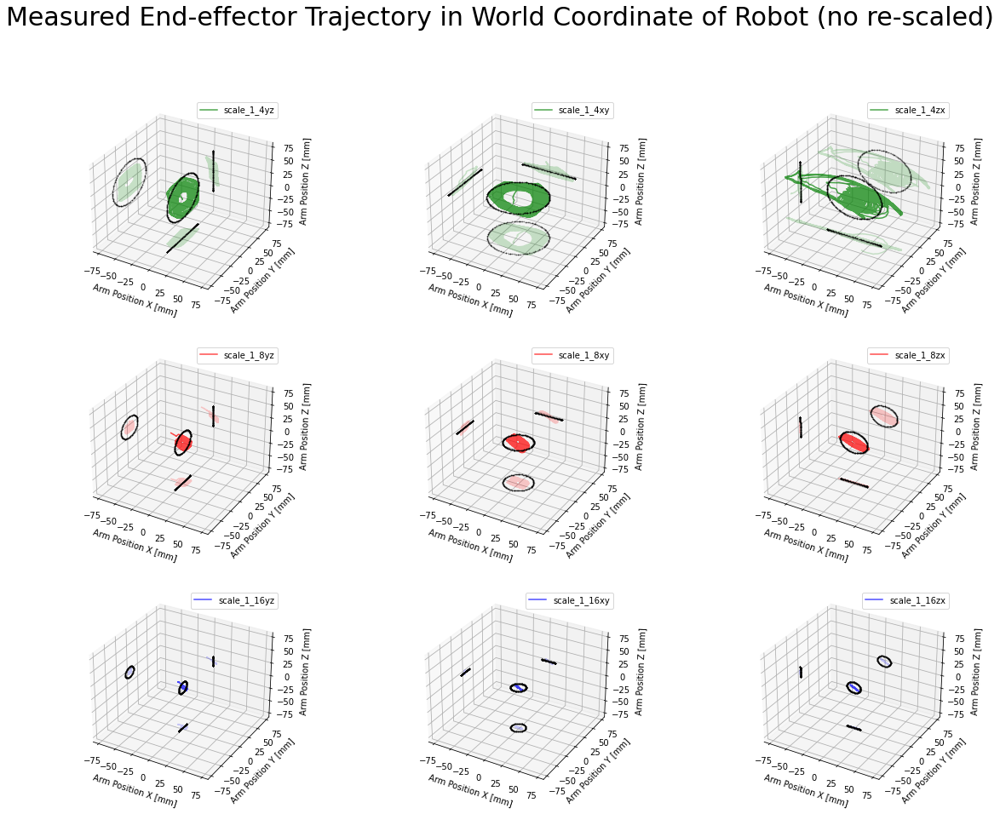

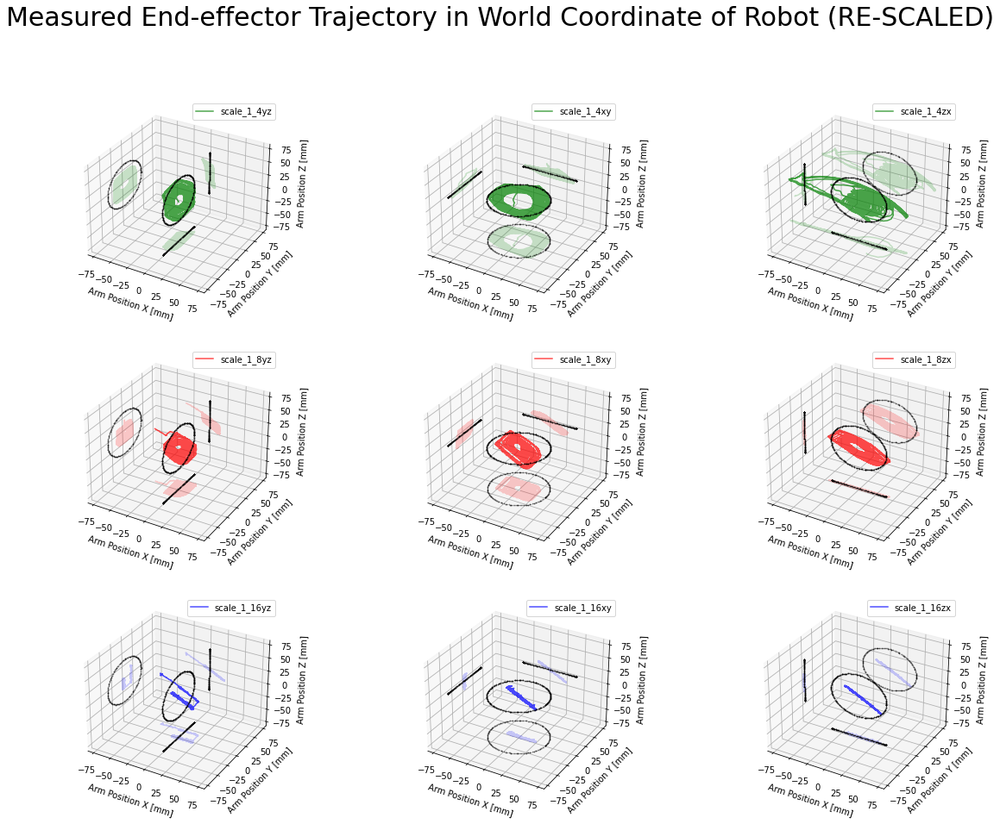

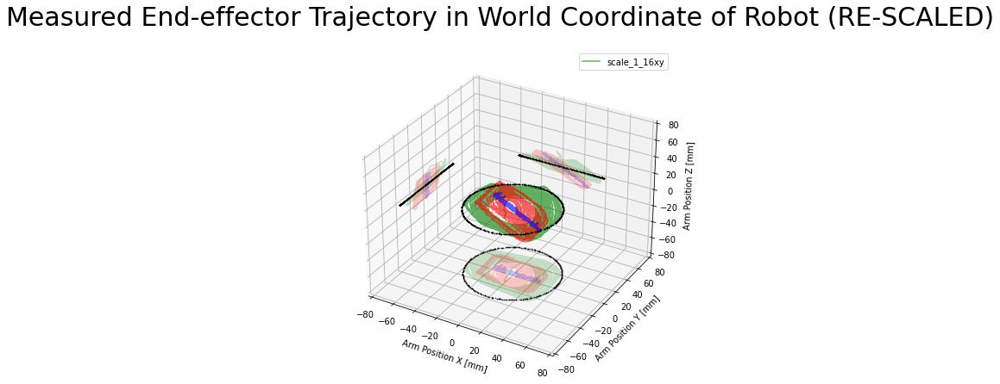

In [43]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

def setname(i):
    # implemented from 
    # https://github.com/maeda-lab/Scaledown/blob/master/simulation/simulation_realtime_Ji_sending/Source.cpp

    # Order of names created... 1/4xy,yz,zx 1/8xy,yz,zx  1/16xy,yz,zx
    # by using "if" ,"%",and "/"
    
    name = 'scale_'

    # C++ source might have bug
    # the following arrangement should be correct
    # Masahiro Furukawa
    if i % 3 == 1:
        space = "xy" 
        movespace = 0
    elif i % 3 == 0:
        space = "yz"
        movespace = 1
    else:
        space = "zx"
        movespace = 2

    if int(i / 3) == 0: 
        scalesize = "1_4"
        scale = 0.25
        c = 'g'
    elif int(i / 3) == 1:
        scalesize = "1_8"
        scale = 0.125
        c = 'r'
    else:
        scalesize = "1_16"
        scale = 0.0625
        c = 'b'

    return (name + scalesize + space , scale, c)

def Coordination_Opti2Robot(x,y,z):
    
    #    Robot : +X(to Front), +Y(to Left), +Z(to Top)
    # **  Opti : +Z(to Front), +X(to Left), +Y(to Top)
    
    return (z, x, y)

def plot_One(key_x, key_y, key_z):   
    
    fps = 120 # <- error !! 120 is correct
    n = len(df['x(mm)'])
    t = np.linspace(0,n,n)/fps
    
    deltaSec = 55
    plotSec = 10
    
    nTrial = int(n/deltaSec/fps)
 
    alpha = 0.2
    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
        
        
    start_in_sec = [10, 110, 247, 375, 475, 575, 675, 775, 875, 975] # incorrect @ 60fps
    start_in_sec = [5, 55, 123, 188, 238, 288, 338, 388, 438, 488] # correct @ 120fps
    
    for s in range(nTrial):
        
        str,_,_ = setname(s)
        
        (x,y,z) = Coordination_Opti2Robot(df[key_x], df[key_y], df[key_z])
        
        plt.subplot(3,3,s+1)
        plt.plot(t, z,'b-',alpha=0.9,label = key_z, markersize=3)
        plt.plot(t, x,'r-',alpha=0.9,label = key_x, markersize=3)
        plt.plot(t, y,'g-',alpha=0.9,label = key_y, markersize=3)
        plt.title('Target Signal as Sequential ' + str)
        plt.xlabel('Time [s]')
        plt.ylabel('Arm Position X, Y, Z [mm]')
#         plt.ylim([0,10])
        ts = start_in_sec[s]
        te = start_in_sec[s+1]
        plt.xlim([ts, te])
        plt.legend()
        plt.grid(True)

    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps
        es = start_in_sec[s+1] *fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) )
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) 
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) )
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)


        sx = sw['x'][:plotSec*fps] * scale * 8.0
        sy = sw['y'][:plotSec*fps] * scale * 8.0        
        sn = np.zeros(len(sx))

        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        def prep_axis(ax, str, ssx, ssy, ssn):
            ax.plot(ssx, ssy, ssn, 'k.', alpha=0.2, label= key_x, markersize=1)
            ax.plot(ssx, ssn, 'k.', zdir='y', zs= 80  ,alpha=0.1, markersize=1)
            ax.plot(ssy, ssn, 'k.', zdir='x', zs=-80  ,alpha=0.1, markersize=1)
            ax.plot(ssx, ssy, 'k.', zdir='z', zs=-80  ,alpha=0.1, markersize=1)        
            ax.set_xlabel('Arm Position X [mm]')
            ax.set_ylabel('Arm Position Y [mm]')
            ax.set_zlabel('Arm Position Z [mm]')
            ax.set_xlim([-80, 80])
            ax.set_ylim([-80, 80])
            ax.set_zlim([-80, 80])
            ax.legend([str])

        prep_axis(ax, str, ssx, ssy, ssn)

    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps
        es = start_in_sec[s+1] *fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)
        
        sx = sw['x'][:plotSec*fps]  * 2.0
        sy = sw['y'][:plotSec*fps]  * 2.0
        sn = np.zeros(len(sx))

        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        prep_axis(ax, str, ssx, ssy, ssn)

    fig = plt.figure(figsize=(10,7))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    ax = fig.add_subplot(111, projection='3d')
    
    for s in [1,4,7]:
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps
        es = start_in_sec[s+1] *fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax.plot(x, y, z, c, alpha=0.6, label=str)

        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)

        sx = sw['x'][:plotSec*fps] * 2.0
        sy = sw['y'][:plotSec*fps] * 2.0
        sn = np.zeros(len(sx))
        
        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy       

        prep_axis(ax, str, ssx, ssy, ssn)

#     plt.tight_layout()
    plt.show()
    
# plot_One('z(mm)', 'x(mm)', 'y(mm)')
plot_One('x(mm)', 'y(mm)', 'z(mm)')

6000


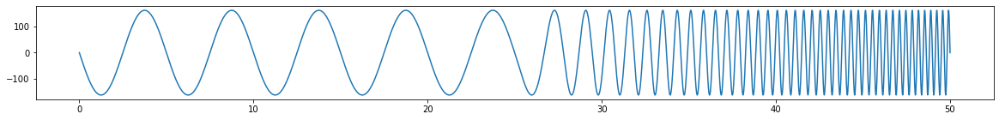

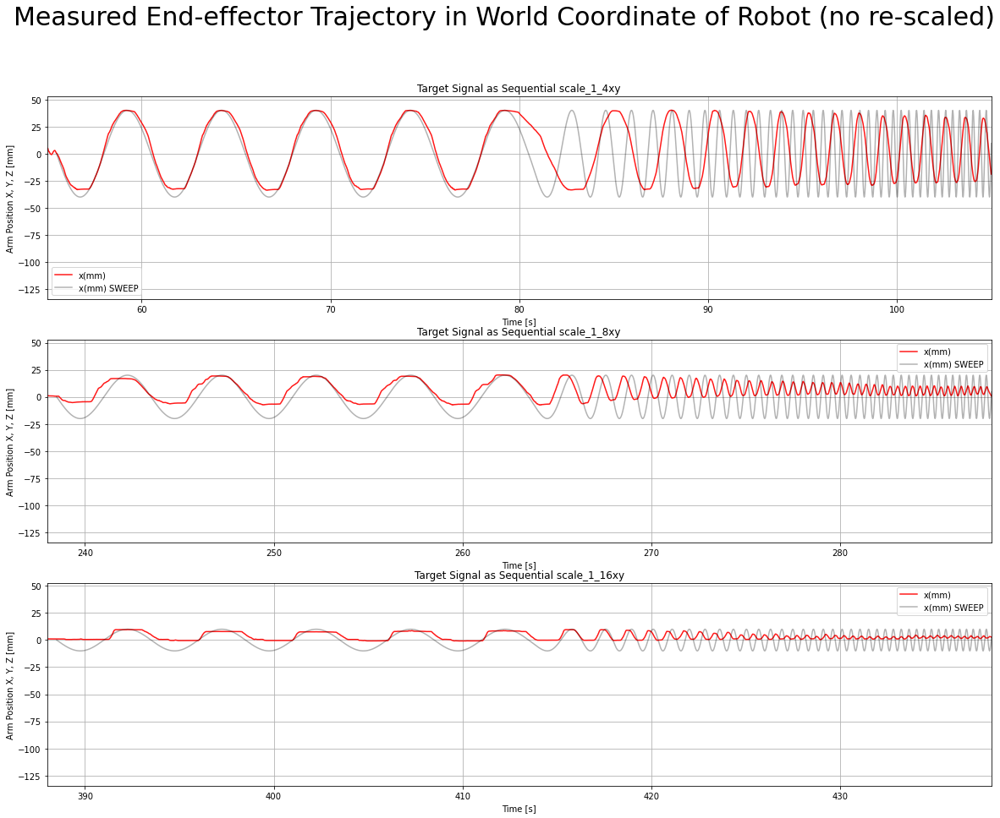

In [131]:
###### import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

# ===========-sweep曲線を作成する========
# Hirayama said;
# sweep信号については条件を変えました。(共有忘れていました)
# fmax:8.0Hzfmin0.2Hz、データ数は8196+冒頭分です。
# 冒頭25秒間は0.2Hzで運動させて、そこからsweep曲線が送られます。

f_max =      1.6  #  Hz
f_min =     0.2  #  Hz
dulation_s = 25   # s
n = 25*fps # 8196 # ??

fps =   120 # Hz

r = 160 # [mm]

delta_f = (f_max - f_min) / n

ns = dulation_s * fps
t1 = np.linspace(0, ns, ns) / fps
t2 = np.linspace(0, n, n) / fps + dulation_s
t = np.append(t1,t2)

# (単位円の半径r)*(PI)*(時刻tにおける振動数f)*(時刻t)
sx120 = -r * np.sin(2.0 * np.pi *  f_min * t[:dulation_s*fps])
sx120s= -r * np.sin(2.0 * np.pi * (f_min + delta_f * np.linspace(0,n,n)) * np.linspace(0,n,n)/fps)
sx120 = np.append(sx120, sx120s)
print(len(sx120))
plt.figure(figsize=(20,2))
plt.plot(t, sx120)
plt.show()


def setname(i):
    # implemented from 
    # https://github.com/maeda-lab/Scaledown/blob/master/simulation/simulation_realtime_Ji_sending/Source.cpp

    # Order of names created... 1/4xy,yz,zx 1/8xy,yz,zx  1/16xy,yz,zx
    # by using "if" ,"%",and "/"
    
    name = 'scale_'

    # C++ source might have bug
    # the following arrangement should be correct
    # Masahiro Furukawa
    if i % 3 == 1:
        space = "xy" 
        movespace = 0
    elif i % 3 == 0:
        space = "yz"
        movespace = 1
    else:
        space = "zx"
        movespace = 2

    if int(i / 3) == 0: 
        scalesize = "1_4"
        scale = 0.25
        c = 'g'
    elif int(i / 3) == 1:
        scalesize = "1_8"
        scale = 0.125
        c = 'r'
    else:
        scalesize = "1_16"
        scale = 0.0625
        c = 'b'

    return (name + scalesize + space , scale, c)

def Coordination_Opti2Robot(x,y,z):
    
    #    Robot : +X(to Front), +Y(to Left), +Z(to Top)
    # **  Opti : +Z(to Front), +X(to Left), +Y(to Top)
    
    return (z, x, y)

def plot_One(key_x, key_y, key_z):   
    
    fps = 120
    n = len(df['x(mm)'])
    t = np.linspace(0,n,n)/fps
    
    deltaSec = 50
    plotSec = 10
    
    nTrial = int(n/deltaSec/fps)
 
    alpha = 0.2
    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
        
    start_in_sec = [10, 110, 247, 375, 475, 575, 675, 775, 875, 975] # incorrect @ 60fps
    start_in_sec = [5, 55, 123, 188, 238, 288, 338, 388, 438, 488] # correct @ 120fps
    
    for s in [1,4,7]:
        
        str,scale,_ = setname(s)
        
        (x,y,z) = Coordination_Opti2Robot(df[key_x], df[key_y], df[key_z])
        
        ts = start_in_sec[s]
        te = ts + deltaSec
        
        plt.subplot(3,1,int(s/3)+1)
#         plt.plot(t, z,'b-',alpha=0.9,label = key_z, markersize=3)
        plt.plot(t, x-np.mean(x), 'r-', alpha=0.9,label = key_x, markersize=3)
        plt.plot(t[ts*fps:te*fps]+.5, sx120[:deltaSec*fps]*scale,'k-', alpha=0.3,label = key_x+' SWEEP', markersize=3)
#         plt.plot(t, y,'g-',alpha=0.9,label = key_y, markersize=3)
        plt.title('Target Signal as Sequential ' + str)
        plt.xlabel('Time [s]')
        plt.ylabel('Arm Position X, Y, Z [mm]')
#         plt.ylim([0,10])
        plt.xlim([ts, te])
        plt.legend()
        plt.grid(True)

        
#     plt.tight_layout()
    plt.show()
    
# plot_One('z(mm)', 'x(mm)', 'y(mm)')
plot_One('x(mm)', 'y(mm)', 'z(mm)')

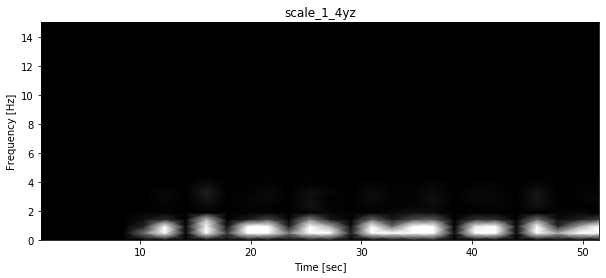

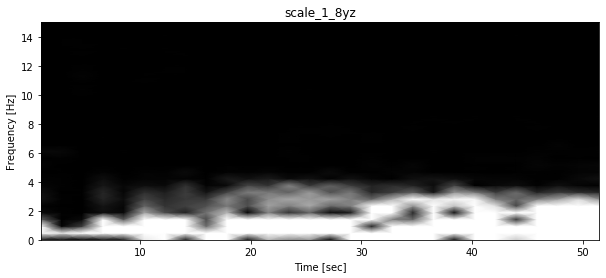

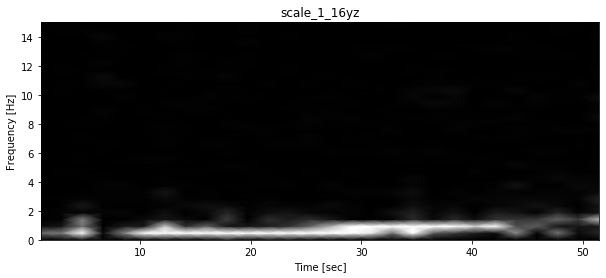

In [33]:
# Masahiro Furukawa
# Aug 31, 2020

# Spectrogram

## coding:utf-8
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
from scipy import fftpack

def plot_Spec(key_x, key_y, key_z):
    
    for s in [0,3,6]:

        fps = 60
        deltaSec = 53
        

        str, scale, c = setname(s)

        ss = s*deltaSec*fps
        es = (s+1)*deltaSec*fps

        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)

        fig = plt.figure(figsize=(10,4))

        vmx = [1e-9, 5*1e-7]
        vmn = [1e-11, 1e-8]

        # spectrogram
        f,t_,Sxx = signal.spectrogram(x, fps, nperseg=128)
        ax = plt.gca()
        ax.pcolormesh(t_, f, Sxx,vmax=1e+1, vmin=1e-17, shading='gouraud', cmap='gray') #coolwarm jet gray 
        # ax.set_xlim([150,400])
        ax.set_ylim([0,fps/4])
        ax.set_title(str)
        ax.set_xlabel(u'Time [sec]')
        ax.set_ylabel(u'Frequency [Hz]')

plot_Spec('x(mm)', 'y(mm)', 'z(mm)')

In [253]:
print(np.power(2,12))

4096
